# M26D19 — cell catalogue by shank

Per-cell spatial/behavioural catalogue for session **M26 D19**, laid out as a **5-panels-per-shank** grid.

**Layout**: each shank occupies a block of 5 columns (with a spacer column between shanks). Shank blocks are ordered **medial → lateral** (left → right). Within each shank, cells are ordered by probe depth (`unit_location_y`) **descending**. Rows = the tallest shank; shorter shanks leave blank rows at the bottom.

**Panels (per cell, left→right within a shank):**
1. VR firing rate map — trial number (rows) × track position (cols)
2. Open-field rate map — with **predictive-coding (travel) correction**
3. Head-direction polar tuning (OF, moving)
4. Speed tuning (OF, moving)
5. Theta power spectrum — LFP PSD, power vs frequency (0–20 Hz)

Cells shown: **classified spatial cells (grid + non-grid) restricted to entorhinal (ENT) regions**.

In [1]:
import warnings; warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import pynapple as nap
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from scipy.signal import welch
from scipy.ndimage import gaussian_filter

from spatial_manifolds.detect_grids import (
    classify_cells_both_sessions, compute_vr_tcs,
    compute_travel_projected, _fill_nans_from_neighbors, plot_firing_rate_map,
)
from spatial_manifolds.util import gaussian_filter_nan
from spatial_manifolds.data.curation import curate_clusters
from spatial_manifolds.anaylsis_parameters import bs, tl

# ------------------------- config -------------------------
MOUSE, DAY = 26, 19
SRC = '/Users/harryclark/Downloads/COHORT12/'
OF_SESSION = 'OF1'          # open-field session used for OF map / HD / speed
THETA_SESSION = 'VR'        # session whose LFP is used for the theta power spectrum
REGION_PREFIX = 'ENT'       # keep only cells whose brain_region starts with this
PERCENTILE = 95             # classification percentile threshold
THETA_FMAX = 20             # Hz, upper limit of the power spectrum panel
ROW_H = 1.15                # inches per catalogue row
COL_W = 1.45                # inches per panel column
FIGPATH = None              # e.g. 'M26D19_cell_catalogue_by_shank.pdf' to save


In [2]:
# ------------------- classify + assemble cell table -------------------
gcs, ngs, _ = classify_cells_both_sessions(MOUSE, DAY, percentile_threshold=PERCENTILE, verbose=False)
comb = pd.concat([gcs.assign(ctype='GC'), ngs.assign(ctype='NGS')], ignore_index=True)

loc = pd.read_csv(SRC + 'all_cluster_brain_locations_chris.csv')
loc = loc[(loc.mouse == MOUSE) & (loc.day == DAY)][
    ['cluster_id', 'shank_id', 'unit_location_x', 'unit_location_y', 'brain_region', 'channel_id']
]
cells = comb.merge(loc, on='cluster_id', how='left', suffixes=('', '_loc'))
cells = cells[cells.brain_region.astype(str).str.startswith(REGION_PREFIX)].copy()

# medial->lateral ordering of shanks: SC_x_flipped = -SC_x, smaller = more medial
cells['SC_x_flipped'] = -cells['SC_x']
shank_medlat = cells.groupby('shank_id')['SC_x_flipped'].mean().sort_values()
SHANKS = list(shank_medlat.index)   # left (medial) -> right (lateral)

print(f'{len(cells)} {REGION_PREFIX} classified cells across shanks {SHANKS} '
      f'({(cells.ctype=="GC").sum()} GC, {(cells.ctype=="NGS").sum()} NGS)')
print('cells per shank:', cells.groupby('shank_id').size().to_dict())

# cells per shank, ordered by depth descending
cells_by_shank = {
    s: cells[cells.shank_id == s].sort_values('unit_location_y', ascending=False).reset_index(drop=True)
    for s in SHANKS
}
n_rows = max(len(v) for v in cells_by_shank.values())
print('rows (tallest shank):', n_rows)

242 ENT classified cells across shanks [1, 2, 3] (46 GC, 196 NGS)
cells per shank: {1: 78, 2: 119, 3: 45}
rows (tallest shank): 119


In [3]:
# ------------------- preload shared data (loaded once) -------------------
of_f = f'{SRC}M{MOUSE}/D{DAY:02}/{OF_SESSION}/'
beh_OF = nap.load_file(of_f + f'sub-{MOUSE}_day-{DAY:02}_ses-{OF_SESSION}_beh.nwb')
clusters_OF = curate_clusters(nap.load_file(of_f + f'sub-{MOUSE}_day-{DAY:02}_ses-{OF_SESSION}_srt-kilosort4_clusters.npz'))
last_of = clusters_OF[clusters_OF.index[0]].count(bin_size=10, time_units='ms').index[-1]
ep_OF = nap.IntervalSet(start=0, end=last_of, time_units='s')
mov_OF = beh_OF['moving']
pos_OF = np.stack([beh_OF['P_x'], beh_OF['P_y']], axis=1)

# position lagged by travel, cached per unique travel value (predictive-coding correction)
_pos_lag_cache = {}
def position_lagged(travel):
    key = float(travel)
    if key not in _pos_lag_cache:
        lag = compute_travel_projected(['P_x', 'P_y'], pos_OF, pos_OF, key)
        _pos_lag_cache[key] = np.stack([lag['P_x'], lag['P_y']], axis=1)
    return _pos_lag_cache[key]

# VR trial x position maps (one pass over the session)
vr_tcs, _, _, last_vr, beh_vr, _ = compute_vr_tcs(MOUSE, DAY, apply_zscore=False)

# LFP for theta power spectrum (loaded once)
theta_lfp = nap.load_file(
    f'{SRC}LFP/M{MOUSE}/D{DAY:02}/{THETA_SESSION}/sub-M{MOUSE}_ses-D{DAY:02}_typ-{THETA_SESSION}_lfp.npz')
vr_clusters = curate_clusters(nap.load_file(
    f'{SRC}M{MOUSE}/D{DAY:02}/{THETA_SESSION}/sub-{MOUSE}_day-{DAY:02}_ses-{THETA_SESSION}_srt-kilosort4_clusters.npz'))
last_theta = vr_clusters[vr_clusters.index[0]].count(bin_size=10, time_units='ms').index[-1]
ep_theta = nap.IntervalSet(start=0, end=last_theta, time_units='s')
chan_tbl = pd.read_csv(SRC + 'all_cluster_brain_locations_chris.csv')
chan_tbl = chan_tbl[(chan_tbl.mouse == MOUSE) & (chan_tbl.day == DAY)]
print('preload complete')

preload complete


In [4]:
# ------------------------- panel drawing functions -------------------------
def panel_vr(ax, cid):
    if cid not in vr_tcs:
        ax.axis('off'); return
    tc = gaussian_filter(np.nan_to_num(vr_tcs[cid]).astype(np.float64), sigma=2.5)[:last_vr]
    plot_firing_rate_map(ax, tc, bs=bs, tl=tl, p=95)
    ax.set_xticks([]); ax.set_yticks([])

def panel_of(ax, cid, travel):
    posl = position_lagged(travel)
    tc = nap.compute_2d_tuning_curves(nap.TsGroup([clusters_OF[cid]]), posl, nb_bins=(40, 40), ep=ep_OF)[0][0]
    tc = gaussian_filter_nan(_fill_nans_from_neighbors(tc), sigma=(2.5, 2.5))
    tc = np.clip(tc, 0, np.nanpercentile(tc, 99))
    ax.imshow(tc, cmap='viridis'); ax.axis('off')

def panel_hd(ax, cid):
    hd = nap.compute_1d_tuning_curves(nap.TsGroup([clusters_OF[cid]]), beh_OF['H'],
                                      nb_bins=20, minmax=(-np.pi, np.pi), ep=mov_OF)[0].values
    theta = np.linspace(-np.pi, np.pi, len(hd), endpoint=False)
    theta = np.append(theta, theta[0]); r = np.append(hd, hd[0])
    ax.plot(theta, r, color='#c0392b', linewidth=1.2)
    ax.fill(theta, r, color='#c0392b', alpha=0.25)
    ax.set_xticks([]); ax.set_yticks([])

def panel_speed(ax, cid):
    sp = nap.compute_1d_tuning_curves(nap.TsGroup([clusters_OF[cid]]), beh_OF['S'],
                                      nb_bins=15, minmax=(3, 45), ep=mov_OF)[0]
    ax.plot(sp.index.values, sp.values, color='#2c7fb8', linewidth=1.2)
    ax.set_xlim(3, 45); ax.margins(y=0.1)
    ax.set_xticks([]); ax.set_yticks([])
    for sp_ in ('top', 'right'): ax.spines[sp_].set_visible(False)

def panel_theta(ax, cid):
    row = chan_tbl[chan_tbl.cluster_id == cid]
    if len(row) == 0:
        ax.axis('off'); return
    chan = row.channel_id.values[0]
    trace = np.asarray(theta_lfp[chan].bin_average(bin_size=10, time_units='ms', ep=ep_theta), dtype=float)
    trace = trace[np.isfinite(trace)]
    if trace.size < 64:
        ax.axis('off'); return
    f, Pxx = welch(trace - trace.mean(), fs=100.0, nperseg=min(1024, trace.size))
    m = f <= THETA_FMAX
    ax.plot(f[m], Pxx[m], color='#555555', linewidth=1.0)
    ax.set_xlim(0, THETA_FMAX); ax.margins(y=0.1)
    ax.set_xticks([]); ax.set_yticks([])
    for sp_ in ('top', 'right'): ax.spines[sp_].set_visible(False)

PANELS = ['VR trials', 'OF map', 'HD', 'Speed', 'Theta']

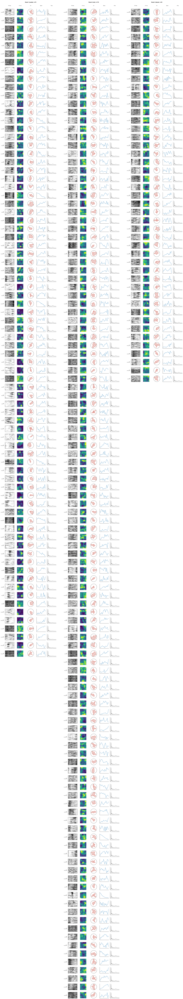

In [5]:
# ------------------------- build the catalogue figure -------------------------
N_PANELS = 5
BLOCK = N_PANELS + 1                       # 5 panels + 1 spacer column
n_cols = len(SHANKS) * BLOCK - 1           # no trailing spacer
fig_w = n_cols * COL_W
fig_h = (n_rows + 1) * ROW_H               # +1 for header row

fig = plt.figure(figsize=(fig_w, fig_h))
gs = GridSpec(n_rows + 1, n_cols, figure=fig, hspace=0.35, wspace=0.15,
              top=0.985, bottom=0.01, left=0.02, right=0.99)

for bi, shank in enumerate(SHANKS):
    c0 = bi * BLOCK
    df = cells_by_shank[shank]
    tag = 'medial' if bi == 0 else ('lateral' if bi == len(SHANKS) - 1 else 'mid')
    # shank header + panel labels on the header row
    for j, lbl in enumerate(PANELS):
        hax = fig.add_subplot(gs[0, c0 + j]); hax.axis('off')
        hax.text(0.5, 0.15, lbl, ha='center', va='bottom', fontsize=7, rotation=0)
    hdr = fig.add_subplot(gs[0, c0:c0 + N_PANELS]); hdr.axis('off')
    hdr.text(0.5, 0.75, f'Shank {shank} ({tag})  n={len(df)}',
             ha='center', va='center', fontsize=10, fontweight='bold')

    for r in range(len(df)):
        cell = df.iloc[r]
        cid = int(cell.cluster_id)
        travel = float(cell.travel) if pd.notna(cell.travel) else 0.0
        gr = cell.get('grid_score', np.nan)
        rr = r + 1  # offset for header row
        try:
            ax = fig.add_subplot(gs[rr, c0 + 0]); panel_vr(ax, cid)
            ax.set_ylabel(f'c{cid}\n{cell.ctype} gs{gr:.1f}', fontsize=6, rotation=0,
                          ha='right', va='center', labelpad=10)
            panel_of(fig.add_subplot(gs[rr, c0 + 1]), cid, travel)
            panel_hd(fig.add_subplot(gs[rr, c0 + 2], projection='polar'), cid)
            panel_speed(fig.add_subplot(gs[rr, c0 + 3]), cid)
            panel_theta(fig.add_subplot(gs[rr, c0 + 4]), cid)
        except Exception as e:
            print(f'cell {cid} (shank {shank}) failed: {e}')

if FIGPATH:
    fig.savefig(FIGPATH, dpi=200, bbox_inches='tight')
    print('saved', FIGPATH)
plt.show()